# UMAP MODEL 

In [1]:
import numpy as np 
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import plotly.express as px

from sklearn import metrics
import math

sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

In [2]:
import umap


## DATA LOADING


This notebook goal is building a model based on UMAP dimensionallity reduction to predict the Remaining Useful Life of a certain instance.

On this purpose, first a UMAP projection is going to be built.

Once we have the projection, we apply it over the new point that we would like to predict. This point, in case that the projection results are good enough, will be near to other instances in a similar health situation.

The last step is selecting a number of "nearest neighbours", based on the two new axes, and predicting as the final outcome the remaining useful life of those. 

In [3]:
train_df = pd.read_csv("C:/Users/eduardo.tadeo/OneDrive - INVENSITY GmbH/Master Thesis/Master Thesis/Datasets/CMAPSSData/train_FD004.txt", delimiter = ' ')
test_df  = pd.read_csv("C:/Users/eduardo.tadeo/OneDrive - INVENSITY GmbH/Master Thesis/Master Thesis/Datasets/CMAPSSData/test_FD004.txt", delimiter = ' ')
RUL_test = pd.read_csv("C:/Users/eduardo.tadeo/OneDrive - INVENSITY GmbH/Master Thesis/Master Thesis/Datasets/CMAPSSData/RUL_FD004.txt")


In [4]:
#Unuseful columns deleting 

train_df.drop(['T_EGT', 'SmFan', 'SmLPC', 'SmHPC'], axis = 1, inplace = True)

test_df.drop(['T_EGT', 'SmFan', 'SmLPC', 'SmHPC'], axis = 1, inplace = True)


###TRAIN DATA SET###

# Standarization for both sensor variables and operational conditions

# Data labeling - Remaining Useful LIfe (RUL) --> Time to failure

RUL = pd.DataFrame(train_df.groupby('Unit')['Cycle'].max()).reset_index()
RUL.columns = ['Unit','UL']
train_df = train_df.merge(RUL, on = ['Unit'], how = 'left')
train_df['RUL'] = train_df['UL'] - train_df['Cycle']


# Data labeling - UL_30 - UL_50 - UL_75 --> Labeling to predict if the turbine is going to fail on les than 30, 50 or 75 cycles

train_df['UL_30'] = np.where(train_df['RUL'] <= 30, 1, 0)
train_df['UL_50'] = np.where(train_df['RUL'] <= 50, 1, 0)
train_df['UL_75'] = np.where(train_df['RUL'] <= 75, 1, 0)


In [5]:
###TEST DATA SET###

# We use the ground truth dataset to generate labels for the test data.
# generate column max for test data
rul = pd.DataFrame(test_df.groupby('Unit')['Cycle'].max()).reset_index()
rul.columns = ['Unit', 'max']
RUL_test.columns = ['more']
RUL_test['Unit'] = RUL_test.index + 1
RUL_test['max'] = rul['max'] + RUL_test['more']
RUL_test.drop('more', axis=1, inplace=True)

# generate RUL for test data
test_df = test_df.merge(RUL_test, on=['Unit'], how='left')
test_df['RUL'] = test_df['max'] - test_df['Cycle']
#test_df.drop('max', axis=1, inplace=True)

#Data labeling - UL_30 - UL_50 - UL_75 --> Labeling to predict if the turbine is going to fail on les than 30, 50 or 75 cycles

test_df['UL_30'] = np.where(test_df['RUL'] <= 30, 1, 0)
test_df['UL_50'] = np.where(test_df['RUL'] <= 50, 1, 0)
test_df['UL_75'] = np.where(test_df['RUL'] <= 75, 1, 0)


### DATA VECTOR PREPARATION

On this stage, I am going to prepare the data vectors that we are using as input for the UMAP projection.


In [6]:
train_df.head()

,Unit,Cycle,OP1,OP2,OP3,T2,T24,T30,T50,P2,...,htBleed,Nf_dmd,PCNfR_dmd,W31,W32,UL,RUL,UL_30,UL_50,UL_75
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,...,330,2212,100.00,10.62,6.3670,321,320,0,0,0
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,...,361,2324,100.00,24.37,14.6552,321,319,0,0,0
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,...,329,2212,100.00,10.48,6.4213,321,318,0,0,0
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,...,328,2212,100.00,10.54,6.4176,321,317,0,0,0
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,...,305,1915,84.93,14.03,8.6754,321,316,0,0,0


In [7]:
train_cols = train_df.columns.difference(['Unit','Cycle','UL','RUL','UL_30','UL_50', 'UL_75'])
train_vector = train_df[train_cols]

train_vector.head()

,BPR,NRc,NRf,Nc,Nf,Nf_dmd,OP1,OP2,OP3,P15,...,T2,T24,T30,T50,W31,W32,epr,farB,htBleed,phi
0,9.3335,8074.83,2387.99,8311.32,2211.86,2212,42.0049,0.8400,100.0,5.70,...,445.00,549.68,1343.43,1112.93,10.62,6.3670,1.01,0.02,330,129.78
1,9.1913,8046.13,2387.73,8713.60,2323.66,2324,20.0020,0.7002,100.0,13.61,...,491.19,606.07,1477.61,1237.50,24.37,14.6552,1.07,0.02,361,312.59
2,9.4007,8066.62,2387.97,8306.69,2211.92,2212,42.0038,0.8409,100.0,5.69,...,445.00,548.95,1343.12,1117.05,10.48,6.4213,1.01,0.02,329,129.62
3,9.3369,8076.05,2388.02,8312.35,2211.88,2212,42.0000,0.8400,100.0,5.70,...,445.00,548.70,1341.24,1118.03,10.54,6.4176,1.02,0.02,328,129.80
4,10.8366,7865.80,2028.08,7994.94,1915.22,1915,25.0063,0.6207,60.0,9.00,...,462.54,536.10,1255.23,1033.59,14.03,8.6754,0.93,0.02,305,164.11


In [8]:
test_vector = test_df[train_cols]

test_vector.head()

,BPR,NRc,NRf,Nc,Nf,Nf_dmd,OP1,OP2,OP3,P15,...,T2,T24,T30,T50,W31,W32,epr,farB,htBleed,phi
0,9.2229,8048.98,2387.78,8704.98,2323.67,2324,20.0072,0.7000,100.0,13.60,...,491.19,606.67,1481.04,1227.81,24.31,14.7007,1.07,0.02,362,313.03
1,10.8632,7863.46,2028.09,7999.94,1915.21,1915,24.9984,0.6200,60.0,9.00,...,462.54,536.22,1256.17,1031.48,14.36,8.5748,0.93,0.02,306,163.61
2,9.3960,8071.13,2387.95,8305.38,2211.93,2212,42.0000,0.8420,100.0,5.69,...,445.00,549.23,1340.13,1105.88,10.39,6.4365,1.01,0.02,328,129.98
3,9.3594,8078.89,2387.90,8301.00,2211.89,2212,42.0035,0.8402,100.0,5.69,...,445.00,549.19,1339.70,1107.26,10.56,6.2367,1.01,0.02,328,129.48
4,9.3030,8057.83,2387.87,8331.05,2222.71,2223,35.0079,0.8400,100.0,7.97,...,449.44,555.10,1353.04,1117.80,14.85,8.9326,1.02,0.02,333,181.82


In [9]:
test_lastcycle = pd.DataFrame([test_df[test_df['Unit']==id].iloc[-1,:]
    for id in test_df['Unit'].unique()]).reset_index(drop = True)

In [10]:
RUL_test = test_lastcycle['RUL']


In [ ]:
test_df[test_df['Unit']==1].tail()

## UMAP MODEL FITTING

In [11]:
train_v = (train_vector.to_numpy())
test_v = (test_lastcycle[train_cols].to_numpy())

In [12]:
print(train_v.shape, test_v.shape)

(61249, 24) (248, 24)


In [13]:
trans = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.25, metric='chebyshev').fit(train_v) # Projection calculation
train_emb = trans.embedding_ # Projection over the euclidean space
test_emb = trans.transform(test_v) # Projection test data set over the euclidean space

In [ ]:
train_df.head()

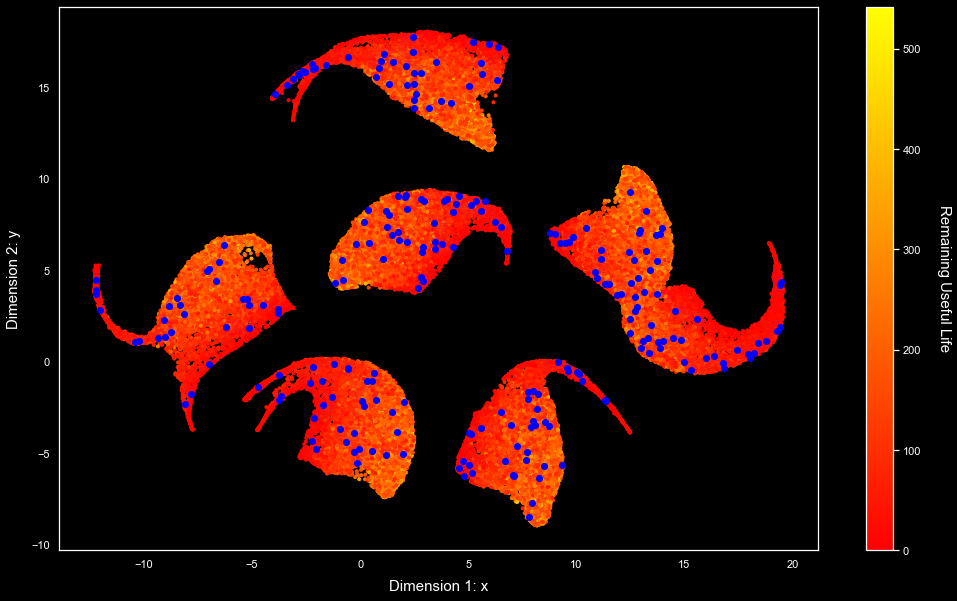

In [14]:
plt.style.use('dark_background')

fig = plt.figure(figsize = (17,10) )

ax = fig.add_subplot(111)

plot = ax.scatter(train_emb[:,0], train_emb[:,1], c = train_df['RUL'], cmap= 'autumn', marker = '.', label = 'Useful Lifetime')

cbar = plt.colorbar(plot)

cbar.ax.set_ylabel('Remaining Useful Life', rotation = 270, size = 15, labelpad = +30)

plot = ax.scatter(test_emb[:,0], test_emb[:,1],  color = 'blue', marker = 'o')

ax.set_xlabel("Dimension 1: x", size = 15, labelpad = 10)
ax.set_ylabel("Dimension 2: y", size = 15, labelpad = 10)
ax.tick_params(colors = 'white')


fig.show()

In [ ]:
plt.style.use('dark_background')

fig = plt.figure(figsize = (17,10) )

ax = fig.add_subplot(111)
plot = ax.scatter(train_emb[:,0], train_emb[:,1], c = train2['UL'], cmap= 'autumn', marker = '.', label = 'Useful Lifetime')

ax.set_xlabel("Dimension 1: x", size = 15, labelpad = 10)
ax.set_ylabel("Dimension 2: y", size = 15, labelpad = 10)
ax.tick_params(colors = 'white')


cbar = plt.colorbar(plot)

cbar.ax.set_ylabel('Remaining Useful Life', rotation = 270, size = 15, labelpad = +30)




fig.show()

In [ ]:
plt.style.use('dark_background')

plt.scatter(train_emb[:,0], train_emb[:,1], c = train2['RUL_index'], cmap= 'autumn', marker = '.', label = 'Remaining Useful Index')

plt.colorbar()
plt.xticks()
plt.yticks()
plt.legend()

In [ ]:
train_df.head()

In [15]:
RUL_train = train_df['RUL'].to_numpy()

RUL_train[RUL_train > 150] = 150

print(RUL_train.shape)

(61249,)


In [16]:
NN = 20

distances = metrics.pairwise_distances(test_emb,train_emb)

RUL_predict = np.zeros(len(test_emb))
RUL_index_predict = np.zeros(len(test_emb))

for i in range(len(test_emb)):

    print('Unidad:', i)

    maxs = np.zeros(NN)

    dist = np.zeros((len(train_emb),2))
    dist[:,0] = range(len(train_emb))
    dist[:,1] = distances[i,:]

    #display(dist)
    #print(dist.shape)

    #display(np.sort(dist[:,1]))

    for j in range(NN):

        #print(np.argmin(dist[:,1]))
        #print(dist[np.argmin(dist[:,1]),1])
        

        maxs[j] = dist[np.argmin(dist[:,1]),0]

        dist = np.delete(dist, obj = np.argmin(dist[:,1]), axis = 0)
    
    RUL_predict[i] = round(np.mean(RUL_train[[maxs.astype(int)]]))

    #print("Maxs: ", maxs)
    #print(RUL_train[maxs.astype(int)])

Unidad: 0
Unidad: 1
Unidad: 2
Unidad: 3
Unidad: 4
Unidad: 5
Unidad: 6
Unidad: 7
Unidad: 8
Unidad: 9
Unidad: 10
Unidad: 11
Unidad: 12
Unidad: 13
Unidad: 14
Unidad: 15
Unidad: 16
Unidad: 17
Unidad: 18
Unidad: 19
Unidad: 20
Unidad: 21
Unidad: 22
Unidad: 23
Unidad: 24
Unidad: 25
Unidad: 26
Unidad: 27
Unidad: 28
Unidad: 29
Unidad: 30
Unidad: 31
Unidad: 32
Unidad: 33
Unidad: 34
Unidad: 35
Unidad: 36
Unidad: 37
Unidad: 38
Unidad: 39
Unidad: 40
Unidad: 41
Unidad: 42
Unidad: 43
Unidad: 44
Unidad: 45
Unidad: 46
Unidad: 47
Unidad: 48
Unidad: 49
Unidad: 50
Unidad: 51
Unidad: 52
Unidad: 53
Unidad: 54
Unidad: 55
Unidad: 56
Unidad: 57
Unidad: 58
Unidad: 59
Unidad: 60
Unidad: 61
Unidad: 62
Unidad: 63
Unidad: 64
Unidad: 65
Unidad: 66
Unidad: 67
Unidad: 68
Unidad: 69
Unidad: 70
Unidad: 71
Unidad: 72
Unidad: 73
Unidad: 74
Unidad: 75
Unidad: 76
Unidad: 77
Unidad: 78
Unidad: 79
Unidad: 80
Unidad: 81
Unidad: 82
Unidad: 83
Unidad: 84
Unidad: 85
Unidad: 86
Unidad: 87
Unidad: 88
Unidad: 89
Unidad: 90
Unidad: 9

In [17]:
print(RUL_predict)

[ 66.  88. 108. 142.  90. 133. 111.  14. 126. 127. 141.  13.  65. 122.
  25. 128. 111. 105. 144. 113. 129.  16.  52. 130.  43. 113. 125. 133.
 142. 142.  13.  54. 150. 133.  40. 105.  80.  30.  80.  15. 129.  31.
 118.  37.  71. 112.  53.  93.  43. 141. 148. 146. 124.  93. 138. 121.
 135.  11. 148. 119.  37.  55. 131.  68.  22. 106.  21.  32.  42.  55.
  33. 144.  42. 139. 129. 143.  49. 106. 114. 102. 100.  18. 129. 144.
 138.  44. 136. 131.  68. 110.  30.  92. 145. 122. 117. 119.  89. 137.
  42.  14.  19.  14.  26. 149.  74.  62.  82. 126. 140.  73.  31.  47.
  30.  42. 118.  43. 126.   7.  85. 113.  40. 141.  39.  55.  94.  10.
 121. 127. 140. 133.  85. 118. 147.  48.  19. 113.  93. 127. 127. 102.
 134. 132.  63. 127.  45. 142.  44. 131. 105.  44.  24. 107. 110.  51.
  35. 140. 139.  23.  15. 135. 142. 104. 124. 122. 130. 125. 118. 135.
 132. 148.  77.  23.  12.  10.  83.  62.  38. 144.  12.  27.  22. 145.
   8.  19.  82. 140.  72. 131. 124. 100. 139.  62. 109.  32. 146. 131.
  41. 

In [18]:
print(RUL_predict.shape, RUL_test.to_numpy().shape)

(248,) (248,)


In [19]:
error = RUL_predict - RUL_test
abs_error = np.absolute(error)
mean_error = np.mean(abs_error)


print("Mean RUL error: " , mean_error )



Mean RUL error:  25.826612903225808


The model score is: 25175.847561058952
The model accuracy is: 29.838709677419352
The model MAE is: 25.826612903225808
The model MSE is : 1058.0201612903224
The model Mean Absolute Percentage Error (MAPE) is: 33.152535780793094
The model Mean Absolute Percentage Error 2 (MAPE_2) is: 11.179513799802288


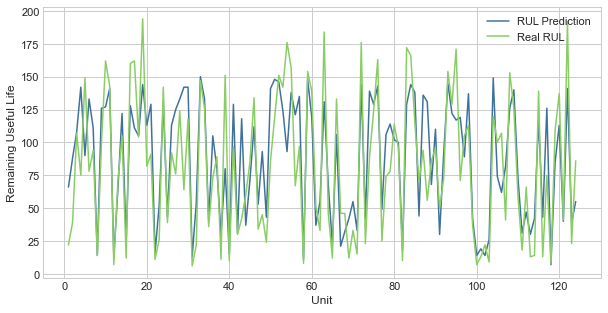

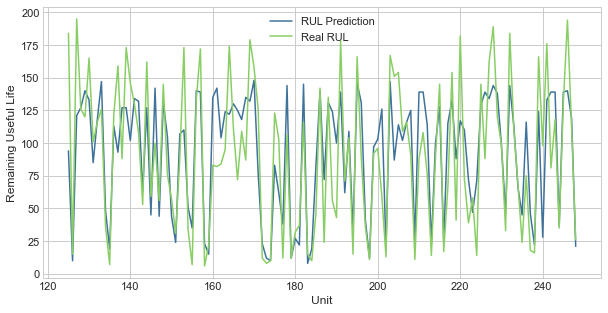

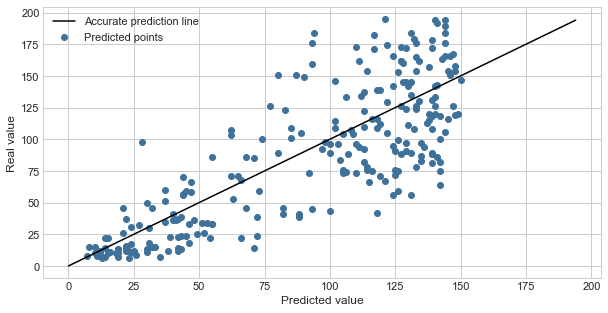

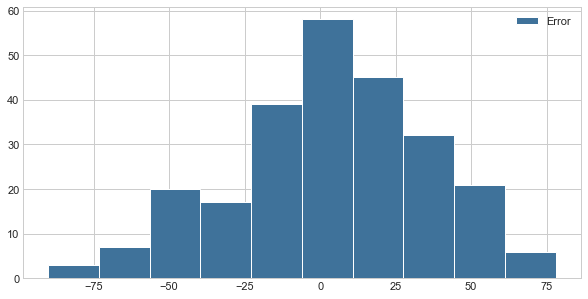

In [20]:
plt.style.use('seaborn-whitegrid')
from Perform_function import perform_func 
y_pred_test = RUL_predict
y_true_test = RUL_test

_, _, _, _, _, _ = perform_func(y_pred_test, y_true_test, test_df.groupby('Unit').max()['Cycle'].to_numpy())

In [ ]:
test_lastcycle['RUL_predict'] = RUL_predict
test_lastcycle['RUL_test'] = RUL_test.to_numpy()[:,0]
test_lastcycle['error'] = error
test_lastcycle['Absolute_error'] = abs_error
test_lastcycle['Embedding_x'] = test_emb[:,0]
test_lastcycle['Embedding_y'] = test_emb[:,1]



In [ ]:
print(test_lastcycle[test_lastcycle['Absolute_error'] > 30])
print(len(test_lastcycle[test_lastcycle['Absolute_error'] > 30]))


In [ ]:
print(error)

error.shape

In [ ]:
RUL_test

In [ ]:
plt.style.use('seaborn-whitegrid')

plt.figure(figsize = (10,5))
plt.plot(range(len(test_emb)), RUL_predict, color = "#3f729a", label = 'Prediction')
plt.plot(range(len(test_emb)), RUL_test, color = "#89ce65", label = 'Real')
#plt.plot(range(len(test_emb[:130])), abs_error[:130], color = 'red', label = 'Error')

plt.ylabel('Remaining Useful Life')
plt.xlabel('Unit')

plt.xticks(range(0,100,10))

plt.legend()

In [ ]:
plt.figure(figsize = (30,5))
plt.plot(range(130, len(test_emb)), RUL_predict[130:], color = 'white', label = 'Prediction')
plt.plot(range(130, len(test_emb)), RUL_test[130:], color = 'green', label = 'Real')
plt.plot(range(130, len(test_emb)), abs_error[130:], color = 'red', label = 'Error')

plt.ylabel('Remaining Useful Life', size = 15)
plt.xlabel('Unit', size = 15)

plt.xticks(range(130,260,10))

plt.legend(fontsize = 'large')


In [ ]:
distances = metrics.pairwise_distances(test_emb,train_emb)

display(distances)

print(distances.shape)

In [ ]:
print(math.sqrt((test_emb[0,0]-train_emb[1,0])**2 + (test_emb[0,1]-train_emb[1,1])**2 ))

In [ ]:
plt.style.use('dark_background')

plt.scatter(train_emb[:,0], train_emb[:,1], c = train2['RUL_index'], cmap= 'autumn', marker = '.', label = 'Train')

plt.colorbar()
plt.scatter(test_lastcycle[test_lastcycle['Absolute_error'] > 10]['Embedding_x'], test_lastcycle[test_lastcycle['Absolute_error'] > 10]['Embedding_y'], c = test_lastcycle[test_lastcycle['Absolute_error'] > 10]['Absolute_error'] , cmap = 'cool', marker= 'o')
plt.colorbar()

In [ ]:
fig = plt.figure(figsize = (10,5))

ax = fig.add_subplot(111)

ax.scatter(RUL_predict, RUL_test, c = "#3f729a", marker = 'o')
ax.plot(range(200), range(200), c = 'black')

ax.set_ylabel('Real value')
ax.set_xlabel('Predicted value')

In [ ]:
from Perform_function import perform_func 
_, _, _, _, _, _ = perform_func(RUL_predict, RUL_test[:,0], test2.groupby('Unit').max()['Cycle'].to_numpy())

In [ ]:
test2.head()

In [ ]:
print(RUL_predict.shape, RUL_test.shape)

#### SCORE METRIC

In [ ]:
s = np.zeros(len(RUL_predict))

a_1 = 10
a_2 = 13

for i in range(len(error)):

    if error[i] < 0 : 

        s[i] = math.exp(-error[i]/a_1) - 1 
    else : 
        s[i] = math.exp(error[i]/a_2) - 1

performance_evaluation = np.sum(s)

print('The model performance evaluation is:', performance_evaluation)



In [32]:
NN = 20

distances = metrics.pairwise_distances(train_emb,train_emb)

RUL_train_predict = np.zeros(len(train_emb))
RUL_index_train_predict = np.zeros(len(train_emb))

for i in range(len(train_emb)):

    print('Unidad:', i)

    maxs = np.zeros(NN)

    dist = np.zeros((len(train_emb),2))
    dist[:,0] = range(len(train_emb))
    dist[:,1] = distances[i,:]

    #display(dist)
    #print(dist.shape)

    #display(np.sort(dist[:,1]))

    for j in range(NN):

        #print(np.argmin(dist[:,1]))
        #print(dist[np.argmin(dist[:,1]),1])
        

        maxs[j] = dist[np.argmin(dist[:,1]),0]

        dist = np.delete(dist, obj = np.argmin(dist[:,1]), axis = 0)
    
    RUL_train_predict[i] = round(np.mean(RUL_train[[maxs.astype(int)]]))

    #print("Maxs: ", maxs)
    #print(RUL_train[maxs.astype(int)])

MemoryError: Unable to allocate 2.79 GiB for an array with shape (19367, 19367) and data type float64

In [ ]:
train_df['RUL_predict'] = RUL_train_predict
train_df['RUL_tuned'] = RUL_train

unit = 69

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize = (10,5))

ax = fig.add_subplot(111)

ax.plot(range(len(train_df[train_df['Unit']==unit])), train_df[train_df['Unit']==unit]['RUL'], color = "#89ce65", label = "Remaining Useful Life")
#ax.plot(range(len(train_df[train_df['Unit']==unit])), Y_tuned[train_df.loc[train_df['Unit']==unit,:].index], color ="#89ce65", label = "Remaining Useful Life with limitation", linestyle = '--')
ax.plot(range(len(train_df[train_df['Unit']==unit])), train_df[train_df['Unit']==unit]['RUL_predict'], color ="#3f729a", label = "Remaining Useful Life prediction")


ax.set_ylabel("Remaining Useful Life")
ax.set_xlabel("Cycle")
ax.set_title("Test unit 69 prediction")

ax.legend()


In [ ]:
train_df['RUL'] = 

In [ ]:
test_lastcycle[test_lastcycle['Absolute_error'] < 10 ]['RUL_test'].mean()

In [ ]:
def Computed_Score(y_true, y_pred):
    ##Computed score used in the challenge

    a1 = 10
    a2 = 13
    score = 0
    d = y_pred - y_true

    for i in d: 
        if i<0:
            score += (e**(-i/a1) - 1)
        else : 
            score += (e**(i/a2) - 1)
    
    return score


In [ ]:
from math import e
Computed_Score(RUL_test.to_numpy()[:,0],RUL_predict)

In [ ]:
print(RUL_test.shape,RUL_predict.shape)

In [ ]:
RUL_test.to_numpy()[:,0]

In [28]:
error_df = pd.DataFrame()
error_df[['Unit','Cycle','RUL']] = test_lastcycle[['Unit','Cycle','RUL']]
error_df['error'] =  np.abs(y_pred_test - y_true_test)

error_df['Group'] = 0
error_df.loc[error_df['Cycle'] <= 20, 'Group'] = 1
error_df.loc[(error_df['Cycle'] <= 40) & (error_df['Cycle'] > 20) , 'Group'] = 2
error_df.loc[(error_df['Cycle'] <= 60) & (error_df['Cycle'] > 40) , 'Group'] = 3
error_df.loc[(error_df['Cycle'] <= 80) & (error_df['Cycle'] > 60) , 'Group'] = 4
error_df.loc[(error_df['Cycle'] <= 100) & (error_df['Cycle'] > 80) , 'Group'] = 5
error_df.loc[(error_df['Cycle'] <= 120) & (error_df['Cycle'] > 100) , 'Group'] = 6
error_df.loc[(error_df['Cycle'] <= 140) & (error_df['Cycle'] > 120) , 'Group'] = 7
error_df.loc[(error_df['Cycle'] > 140) , 'Group'] = 8

error_df['Group_RUL'] = 0
error_df.loc[error_df['RUL'] <= 20, 'Group_RUL'] = 1
error_df.loc[(error_df['RUL'] <= 40) & (error_df['RUL'] > 20) , 'Group_RUL'] = 2
error_df.loc[(error_df['RUL'] <= 60) & (error_df['RUL'] > 40) , 'Group_RUL'] = 3
error_df.loc[(error_df['RUL'] <= 80) & (error_df['RUL'] > 60) , 'Group_RUL'] = 4
error_df.loc[(error_df['RUL'] <= 100) & (error_df['RUL'] > 80) , 'Group_RUL'] = 5
error_df.loc[(error_df['RUL'] <= 120) & (error_df['RUL'] > 100) , 'Group_RUL'] = 6
error_df.loc[(error_df['RUL'] <= 140) & (error_df['RUL'] > 120) , 'Group_RUL'] = 7
error_df.loc[(error_df['RUL'] <= 160) & (error_df['RUL'] > 140) , 'Group_RUL'] = 8
error_df.loc[(error_df['RUL'] <= 180) & (error_df['RUL'] > 160) , 'Group_RUL'] = 9
error_df.loc[(error_df['RUL'] > 180) , 'Group_RUL'] = 10

In [29]:
error_grouped  = error_df.groupby('Group').mean()

error_grouped_RUL = error_df.groupby('Group_RUL').mean()

error_grouped

,Unit,Cycle,RUL,error,Group_RUL
Group,,,,,
1,150.500000,19.500000,131.250000,23.750000,7.000000
2,133.500000,30.250000,165.083333,38.000000,8.750000
3,116.090909,52.181818,131.272727,21.454545,7.090909
4,162.133333,68.133333,127.133333,29.400000,6.933333
5,125.611111,90.500000,128.500000,30.944444,6.833333
6,122.653846,110.961538,99.461538,26.384615,5.461538
7,133.000000,129.565217,77.304348,31.826087,4.304348
8,118.374101,227.935252,64.251799,23.035971,3.669065


In [30]:
error_grouped_RUL

error_df[error_df['Group_RUL']==0]

,Unit,Cycle,RUL,error,Group,Group_RUL


In [ ]:
fig = plt.figure(figsize = (10,5))

ax = fig.add_axes([0,0,1,1])
ratios = ['20-40', '40-60', '60-80', '80-100', '100-120','120-140', '>140']
errors = error_grouped['error']
ax.bar(ratios,errors,color="#3f729a")
plt.ylabel("Mean Absolute Error")
plt.xlabel("Cycle ranges")
plt.ylim(0,50)
plt.show()


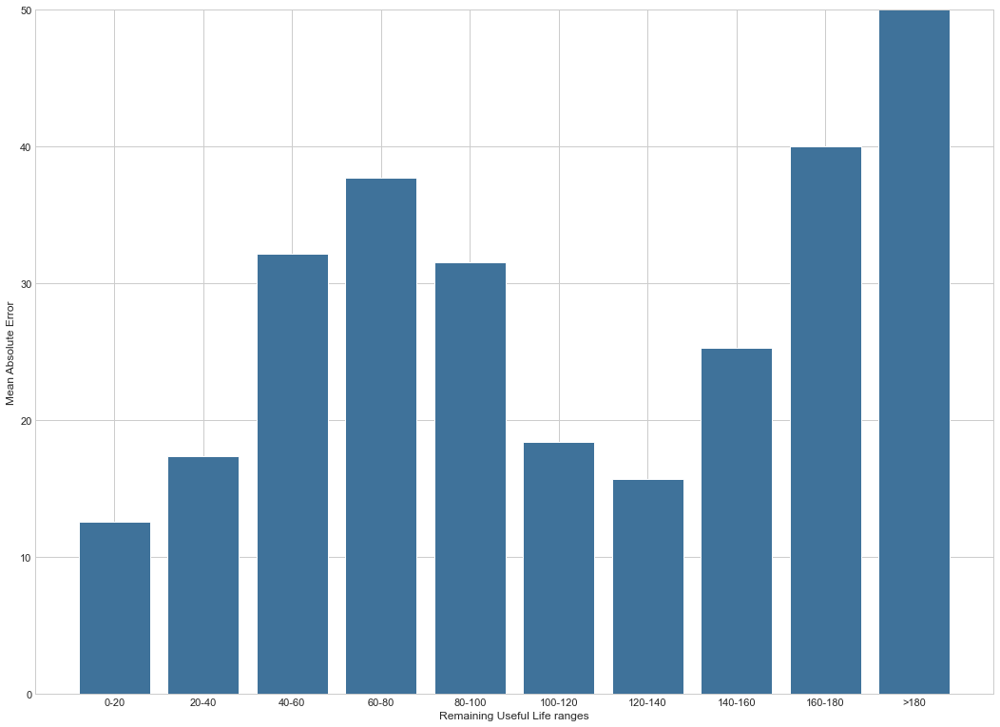

In [31]:
fig = plt.figure()

ax = fig.add_axes([0,0,1,1])
ratios = ['0-20','20-40', '40-60', '60-80', '80-100', '100-120','120-140','140-160','160-180', '>180']
errors = error_grouped_RUL['error']
ax.bar(ratios,errors,color="#3f729a")
plt.ylabel("Mean Absolute Error")
plt.xlabel("Remaining Useful Life ranges")
plt.ylim(0,50)
plt.show()

In [ ]:
pd.DataFrame(y_pred_test, columns = ['RUL']).to_csv('UMAP_FD1_prediction.csv')

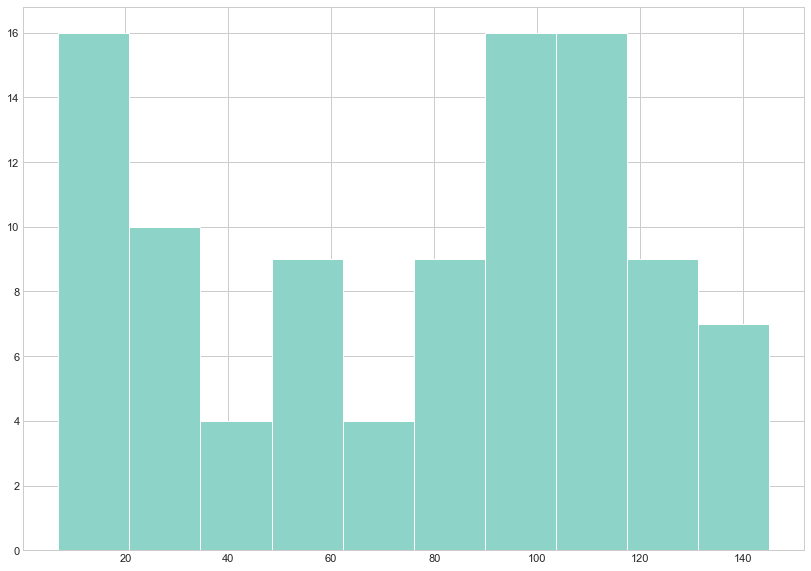

In [23]:
plt.hist(test_lastcycle['RUL'])
plt.show()